In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score, roc_auc_score, roc_curve, adjusted_rand_score
from pandas_profiling import ProfileReport
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import KNNImputer
import imageio
from PIL import Image
import warnings
warnings.filterwarnings("ignore")
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax
pd.set_option('display.max_columns', 50)
pd.set_option('display.max_rows', 100)

# EDA and preprocess

In [975]:
music_df = pd.read_csv("music_genre.csv").drop(columns=['instance_id', 'obtained_date', 'artist_name', 'track_name', 'key']) # drop useless columns
# select a subset of the dataset
music_df = music_df[music_df['music_genre'].isin(['Anime', 'Classical', 'Hip-Hop', 'Jazz'])]

In [911]:
report = ProfileReport(music_df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [976]:
drop_index = music_df[(music_df['duration_ms']==-1) | (music_df['tempo']=='?')].index
music_df.drop(index = drop_index, inplace=True)

In [977]:
# Label encoding for music_genre
le = LabelEncoder()
music_df['music_genre'] = le.fit_transform(music_df['music_genre'])
music_df['mode'] = le.fit_transform(music_df['mode'])
music_df['tempo'] = np.round(music_df['tempo'].astype(float), 3)
X = music_df.drop(columns=['music_genre'])

In [978]:
# Standardize all columns except for target
std = StandardScaler()
std_X = pd.DataFrame(std.fit_transform(X), 
                      index = X.index, 
                      columns = X.columns)

In [973]:
std_X

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,mode,speechiness,tempo,valence
5000,-1.614540,-1.112897,-0.759957,1.278881,-0.116650,-0.723675,0.513052,0.063072,1.204617,-0.579427,0.064796,-0.295392
5002,-0.548741,-1.130160,0.589177,-0.158816,1.550115,-0.776264,0.492669,0.984390,1.204617,-0.517558,0.511647,1.952277
5004,0.694692,-1.115172,0.224287,0.088269,-0.626484,-0.784637,-0.773157,0.425764,1.204617,-0.659107,0.818008,-0.822432
5005,-0.252685,-1.115930,0.440341,-0.021409,1.461875,-0.784420,-0.438185,1.166725,-0.830139,-0.286018,1.041870,1.107463
5006,-1.200063,-1.024182,-0.337452,-0.408965,1.419388,-0.784605,1.090589,1.108996,-0.830139,1.299140,2.016577,1.033833
...,...,...,...,...,...,...,...,...,...,...,...,...
49999,1.049959,-0.815662,1.578222,-0.138190,0.550056,-0.784617,0.771245,0.577319,-0.830139,-0.448190,-0.484768,0.855569
50001,1.997336,-0.755002,0.906056,-0.033379,-0.423858,-0.784637,-0.499336,0.253566,-0.830139,-0.416318,0.202109,-1.144081
50002,0.753903,-1.136732,0.829237,-0.494014,0.886677,-0.784637,-0.268322,0.793896,-0.830139,0.436724,0.483524,-0.051249
50003,1.582858,-0.941785,1.256543,0.047210,-0.064359,-0.784637,-0.519720,0.846680,1.204617,-0.518496,-1.235395,-0.210136


# K Means

In [925]:
# Question 1
score_ls = []
for i in range(10):
    kmeans = KMeans(n_clusters = 4, init='random', random_state=i, n_init=1)
    music_df['pred'] = kmeans.fit_predict(std_X)
    print("Number of iterations: ", kmeans.n_iter_)
    score_ls.append(round(adjusted_rand_score(music_df['pred'], music_df['music_genre']), 4))
#music_df['pred'].value_counts()

Number of iterations:  13
Number of iterations:  27
Number of iterations:  22
Number of iterations:  12
Number of iterations:  41
Number of iterations:  38
Number of iterations:  42
Number of iterations:  27
Number of iterations:  38
Number of iterations:  12


Text(0, 0.5, 'adjusted rand index')

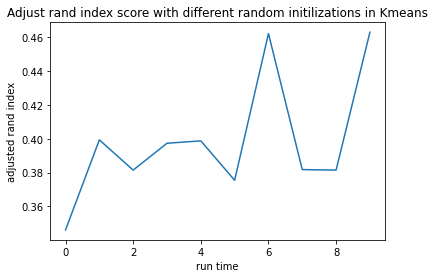

In [926]:
# Plot adjuested rand index score
plt.plot(pd.Series(score_ls))
plt.title("Adjust rand index score with different random initilizations in Kmeans")
plt.xlabel('run time')
plt.ylabel('adjusted rand index')

In [979]:
# Question 2
# try k from 2 to 10
k_scores = []
scores = []
mse = []
k_mse = []
for k in range(2, 10):
    for i in range(10):
        kmeans = KMeans(n_clusters = k, init='random', random_state=i)
        music_df['pred'] = kmeans.fit_predict(std_X)
        scores.append(round(adjusted_rand_score(music_df['music_genre'], music_df['pred']), 4))
        mse.append(round(kmeans.inertia_))
    k_scores.append(np.mean(scores))
    k_mse.append(np.mean(mse))

Text(0, 0.5, 'adjusted rand index')

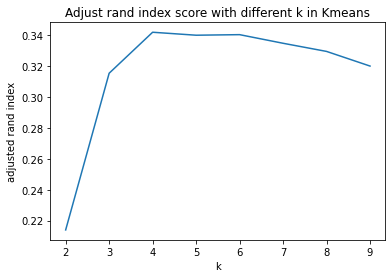

In [982]:
# Plot adjuested rand index score
score_df = pd.DataFrame({'k_score':k_scores, 'k':range(2,10)})
plt.plot(score_df['k'], score_df['k_score'])
plt.title("Adjust rand index score with different k in Kmeans")
plt.xlabel('k')
plt.ylabel('adjusted rand index')

Text(0, 0.5, 'mse')

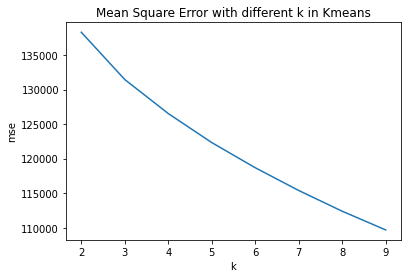

In [983]:
# Plot mean square error
mse_df = pd.DataFrame({'mse':k_mse, 'k':range(2,10)})
plt.plot(mse_df['k'], mse_df['mse'])
plt.title("Mean Square Error with different k in Kmeans")
plt.xlabel('k')
plt.ylabel('mse')

In [962]:
# Question 3
# Gaussian mixture model
gaussian_scores = []
scores = []
for k in range(2, 10):
    for i in range(10):
        gm = GaussianMixture(n_components=k, init_params='kmeans', tol=1e-4, max_iter=300, random_state=0)
        music_df['pred'] = gm.fit_predict(std_X)
        scores.append(adjusted_rand_score(music_df['music_genre'], music_df['pred']))
    gaussian_scores.append(np.mean(scores))

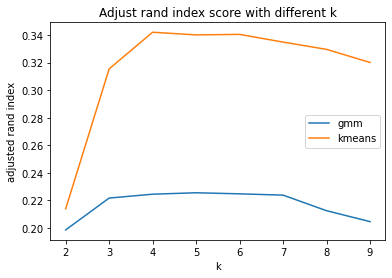

In [985]:
# Plot adjuested rand index score
score_df['gmm_score'] = gaussian_scores
plt.plot(score_df['k'], score_df['gmm_score'], label='gmm')
plt.plot(score_df['k'], score_df['k_score'], label='kmeans')
plt.title("Adjust rand index score with different k")
plt.xlabel('k')
plt.ylabel('adjusted rand index')
plt.legend()

In [ ]:
# Question 4
# PCA

In [986]:
pca = PCA(n_components=2)
pca_X = pd.DataFrame(data=pca.fit_transform(std_X), columns=['pc1', 'pc2'])
print('Total variance explained: ', round(pca.explained_variance_ratio_.sum(), 4))
pca_X['true'] = music_df['music_genre'].values

Total variance explained:  0.4742


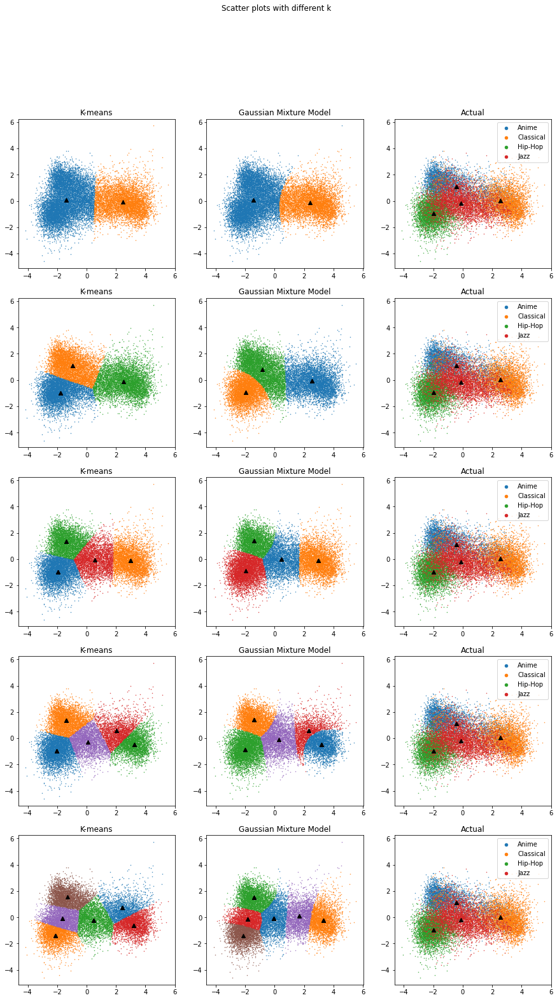

In [952]:
# Scatter plots
fig, axs = plt.subplots(5, 3, figsize=(15,25))

fig.suptitle("Scatter plots with different k")
pca_X['true'] = music_df['music_genre'].values

scores_df = pd.DataFrame(columns=['k', 'kmeans', 'gm'])
for k in range(2, 7):
    kmeans = KMeans(n_clusters = k, init='random')
    pca_X['kmeans_pred'] = kmeans.fit_predict(pca_X[['pc1', 'pc2']])
    gm = GaussianMixture(n_components = k)
    pca_X['gaussian_pred'] = gm.fit_predict(pca_X[['pc1', 'pc2']])
    
    kmeans_score = adjusted_rand_score(pca_X['kmeans_pred'], pca_X['true'])
    gm_score = adjusted_rand_score(pca_X['gaussian_pred'], pca_X['true'])
    scores_df.loc[k-2] = [k, kmeans_score, gm_score]
    
    kmeans_centroids = kmeans.cluster_centers_
    gmm_centroids = np.array([[pca_X.loc[pca_X['gaussian_pred']==z, 'pc1'].mean(), 
                               pca_X.loc[pca_X['gaussian_pred']==z, 'pc2'].mean()] for z in range(k)])
    true_centroids = np.array([[pca_X.loc[pca_X['true']==z, 'pc1'].mean(), 
                               pca_X.loc[pca_X['true']==z, 'pc2'].mean()] for z in range(4)])
    music_genre = ['Anime', 'Classical', 'Hip-Hop', 'Jazz']
    for i in range(k):
        axs[k-2, 0].scatter(pca_X.loc[pca_X['kmeans_pred']==i, 'pc1'], pca_X.loc[pca_X['kmeans_pred']==i, 'pc2'], s = 0.2)
        axs[k-2, 0].scatter(kmeans_centroids[:, 0], kmeans_centroids[:, 1], marker="^", color='black')
        axs[k-2, 0].set_title("K-means")
        axs[k-2, 1].scatter(pca_X.loc[pca_X['gaussian_pred']==i, 'pc1'], pca_X.loc[pca_X['gaussian_pred']==i, 'pc2'], s = 0.2)
        axs[k-2, 1].scatter(gmm_centroids[:, 0], gmm_centroids[:, 1], marker="^", color='black')
        axs[k-2, 1].set_title("Gaussian Mixture Model")
    for j in range(4):
        axs[k-2, 2].scatter(pca_X.loc[pca_X['true']==j, 'pc1'], pca_X.loc[pca_X['true']==j, 'pc2'], s = 0.2, label = music_genre[j])
        axs[k-2, 2].scatter(true_centroids[:, 0], true_centroids[:, 1], marker="^", color='black')
        axs[k-2, 2].set_title("Actual")
    axs[k-2, 2].legend(markerscale=10, loc='upper right')
plt.show()

In [953]:
scores_df

,k,kmeans,gm
0,2.0,0.212847,0.213151
1,3.0,0.396595,0.400691
2,4.0,0.439097,0.438358
3,5.0,0.408157,0.402231
4,6.0,0.331496,0.340721


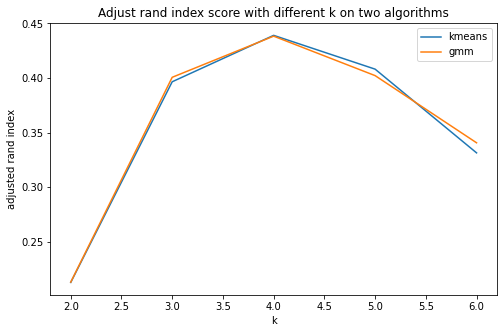

In [972]:
plt.figure(figsize=(8,5))
plt.plot(scores_df['k'], scores_df['kmeans'], label='kmeans')
plt.plot(scores_df['k'], scores_df['gm'], label='gmm')
plt.title("Adjust rand index score with different k on two algorithms")
plt.xlabel('k')
plt.ylabel('adjusted rand index')
plt.legend()

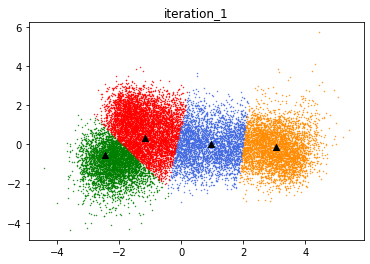

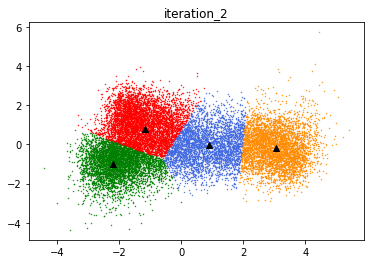

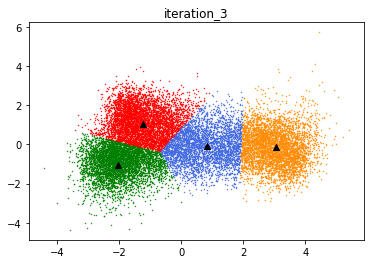

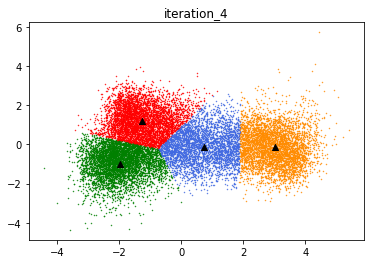

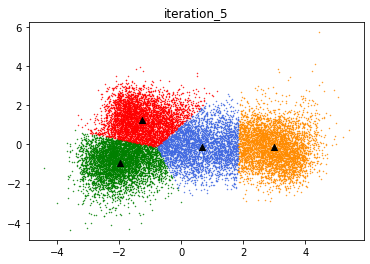

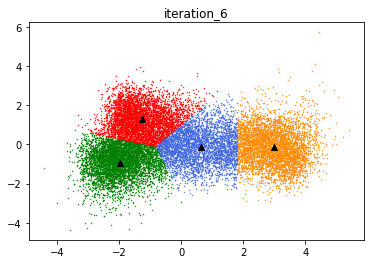

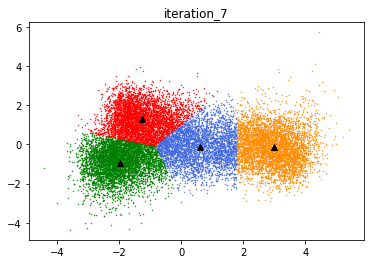

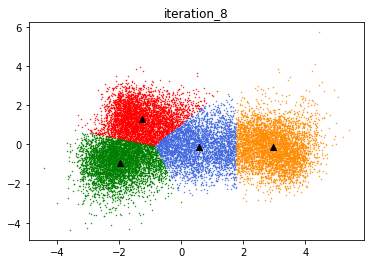

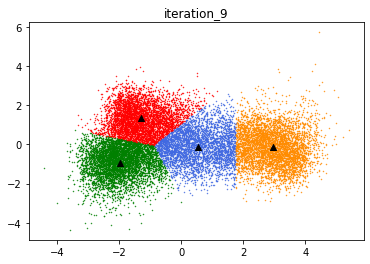

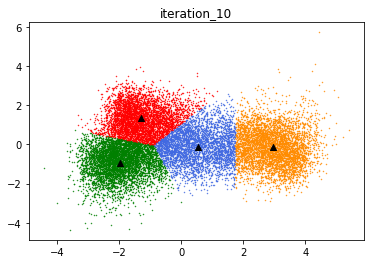

In [752]:
max_iter_ls = [i+1 for i in range(10)]
for max_iter in max_iter_ls:
    kmeans = KMeans(n_clusters = 4, max_iter=max_iter, random_state=0, 
                    init = np.array([[-3, 0], [-1, 0], [1, 0], [3, 0]]))
    pca_X['kmeans_pred'] = kmeans.fit_predict(pca_X[['pc1', 'pc2']])
    kmeans_centroids = kmeans.cluster_centers_
    color = ['g', 'r', 'royalblue', 'darkorange']
    for i in range(4):
        plt.scatter(pca_X.loc[pca_X['kmeans_pred']==i, 'pc1'], pca_X.loc[pca_X['kmeans_pred']==i, 'pc2'], s = 0.2, color = color[i])
    plt.scatter(kmeans_centroids[:, 0], kmeans_centroids[:, 1], marker="^", color='black')
    plt.title(f"iteration_{max_iter}")
    plt.savefig(f'./iter{max_iter}.jpg')
    plt.show()

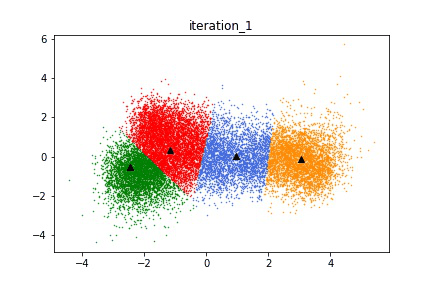

In [753]:
image_path = [f'iter{i+1}.jpg' for i in range(10)]
gif_images = []
for path in image_path:
    gif_images.append(imageio.imread(path))
imageio.mimsave("kmeans.gif", gif_images,fps=2)
im = Image.open('kmeans.gif')
im

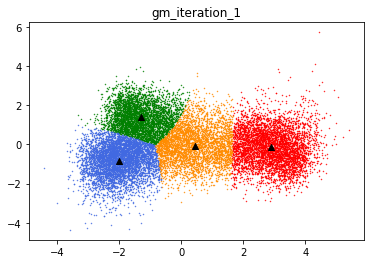

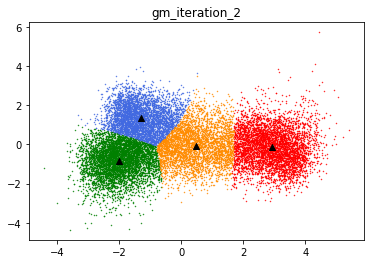

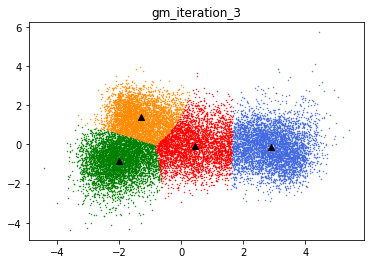

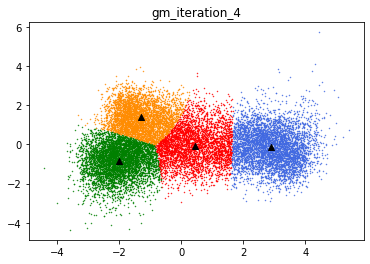

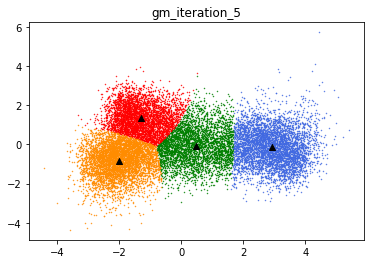

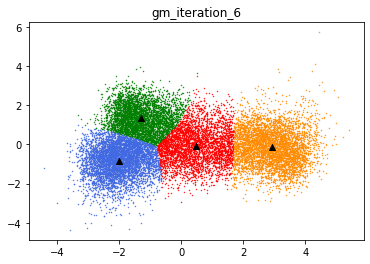

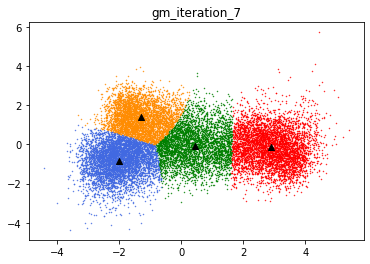

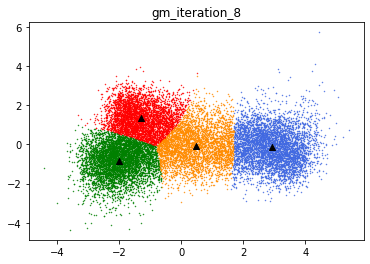

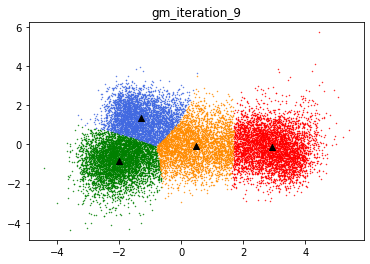

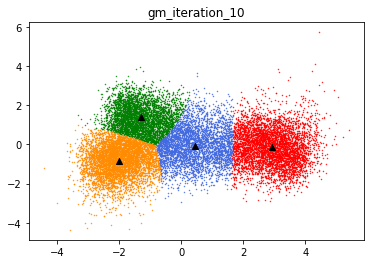

In [777]:
max_iter_ls = [i+1 for i in range(10)]
for max_iter in max_iter_ls:
    gm = GaussianMixture(n_components = 4)
    pca_X['gaussian_pred'] = gm.fit_predict(pca_X[['pc1', 'pc2']])
    gmm_centroids = np.array([[pca_X.loc[pca_X['gaussian_pred']==z, 'pc1'].mean(), 
                               pca_X.loc[pca_X['gaussian_pred']==z, 'pc2'].mean()] for z in range(k)])
    color = ['g', 'r', 'royalblue', 'darkorange']
    for i in range(4):
        plt.scatter(pca_X.loc[pca_X['gaussian_pred']==i, 'pc1'], pca_X.loc[pca_X['gaussian_pred']==i, 'pc2'], s = 0.2, color = color[i])
    plt.scatter(gmm_centroids[:, 0], gmm_centroids[:, 1], marker="^", color='black')
    plt.title(f"gm_iteration_{max_iter}")
    plt.savefig(f'./gm_iter{max_iter}.jpg')
    plt.show()

In [1036]:
error = np.random.randint(-10, 10)/100
x_ls = [np.random.randint(-100, 100)/100+np.random.randint(-10, 10)/100 for i in range(50)]
y_ls = [np.sqrt(1-x**2)+np.random.randint(-10, 10)/100 for x in x_ls]
y2_ls = [-np.sqrt(1-x**2)+np.random.randint(-10, 10)/100 for x in x_ls]

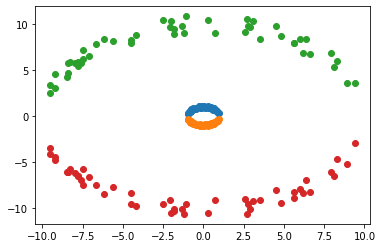

In [1037]:
plt.plot()
plt.scatter(x_ls, y_ls)
plt.scatter(x_ls, y2_ls)
plt.scatter([x*10 for x in x_ls], [y*10 for y in y_ls])
plt.scatter([x*10 for x in x_ls], [y*10 for y in y2_ls])
plt.show()

In [1038]:
test_df = pd.DataFrame({'x': x_ls+[x*10 for x in x_ls], 'y': y_ls+[y*10 for y in y_ls]})

In [1039]:
kmeans = KMeans(n_clusters=2)
test_df['pred'] = kmeans.fit_predict(test_df)

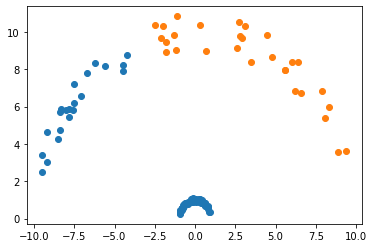

In [1042]:
plt.scatter(test_df.loc[test_df['pred']==0, 'x'], test_df.loc[test_df['pred']==0, 'y'])
plt.scatter(test_df.loc[test_df['pred']==1, 'x'], test_df.loc[test_df['pred']==1, 'y'])

In [1041]:
gmm = GaussianMixture(n_components=2)
test_df['pred'] = gmm.fit_predict(test_df)